# Thumys human spatial atlas, fine annotation 
# this notebook is to load the raw object and then annotate in high resolution every lineage seperatly 
# last edit 211222


In [2]:
# fine annotate lineage 
import scanpy as sc
import numpy as np
import pandas as pd
import scvi
import seaborn as sns
import os,sys
import mudata
import anndata

import scvi

import multi_view_atlas as mva
sc.logging.print_header()


Global seed set to 0
/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.9.1 pandas==1.4.2 scikit-learn==1.1.1 statsmodels==0.13.2 python-igraph==0.9.11 louvain==0.7.1 pynndescent==0.5.7


# fine annotate every lineage

In [264]:
h5ad_file = '/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/Thymus_Atlas_Full_postQC_SCVI_v6.h5ad'

adata_full = sc.read_h5ad(h5ad_file)
# adata_full.write_h5ad(h5ad_file)

/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:444: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)


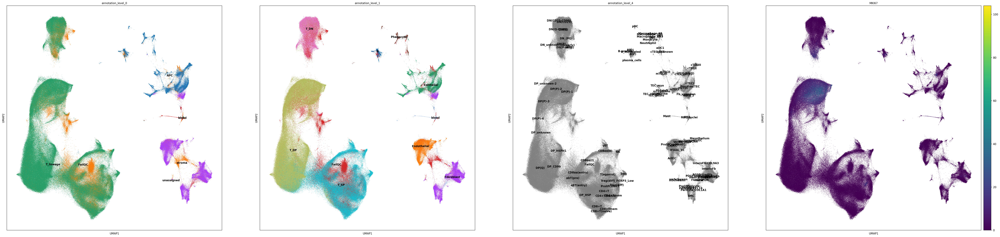

In [134]:
sc.set_figure_params(figsize=[15,15],fontsize=10)
# sc.pl.umap(adata_full, color=['annotation_level_4'],groups='DP(P)-1', legend_loc='on data',s=2)
sc.pl.umap(adata_full, color=['annotation_level_0','annotation_level_1','annotation_level_4','MKI67'], legend_loc='on data',s=2)

In [168]:
def scVI_wrapper(adata,annotation,subgroup,max_epochs=350,remove_vdjgenes=True,batch_key = 'sample'):
    adata_tmp = adata_full[adata_full.obs[annotation].isin(subgroup),:] 
    cc_genes =  ['C1orf112', 'KDM1A', 'ARHGAP33', 'CDC27', 'AC004381.6', 'DBF4', 'PRSS21', 'E2F2', 'BAZ1B', 'NCAPD2', 'ANLN', 'BRCA1', 'UBR7', 'DDX11', 'TACC3', 'POLA2', 'DEPDC1', 'NCAPH2', 'HMGB3', 'CENPQ', 'DEPDC1B', 'SPDL1', 'TDP1', 'DSG2', 'NOP16', 'RFC2', 'RAD51', 'POLQ', 'THOC3', 'MRTO4', 'C4orf27', 'POLD1', 'TM7SF3', 'MCM10', 'MTHFD2', 'YBX1', 'ASPM', 'PRR11', 'NUCKS1', 'EXOC5', 'TCOF1', 'RAD18', 'TRIP13', 'DAZAP1', 'HLTF', 'PDCD2', 'SMC1A', 'HMMR', 'MCM2', 'NUP37', 'GTSE1', 'WDR62', 'MCM6', 'MLH1', 'UNG', 'SPAG5', 'UBE2T', 'EXOSC5', 'FAM76B', 'POLD3', 'KIF22', 'PUM3', 'RBL1', 'NDC80', 'HSPB11', 'OXCT1', 'SEH1L', 'ORC1', 'RAD54L', 'NOP14', 'GMCL1', 'AURKA', 'TPX2', 'BIRC5', 'KIF4A', 'FH', 'ORC6', 'G2E3', 'WDR76', 'PHGDH', 'CLSPN', 'NUP50', 'CDC45', 'CDC6', 'CBX5', 'MSH2', 'FKBP5', 'ACOT7', 'CDC7', 'RANBP1', 'CENPM', 'HMGXB4', 'MCM5', 'RANGAP1', 'POLE2', 'CDKN3', 'ERH', 'MTHFD1', 'VRK1', 'EMC9', 'GINS1', 'MYBL2', 'CDC25B', 'PLCB4', 'FAM83D', 'CEP76', 'RBBP8', 'POLA1', 'NUP93', 'CTCF', 'CCP110', 'CEP152', 'OIP5', 'MYEF2', 'MCM4', 'KCTD9', 'RNASEH2A', 'SGTA', 'ASF1B', 'LIG1', 'H2AFV', 'GARS', 'NUDT1', 'RPA3', 'EZH2', 'RHEB', 'SMC3', 'UBE2S', 'RAD51C', 'GALK1', 'C1QBP', 'BLMH', 'TMEM97', 'GAR1', 'NEIL3', 'WHSC1', 'NCAPG', 'CCDC34', 'CCDC86', 'MAGOHB', 'FOXM1', 'GPN3', 'RAD51AP1', 'RFC5', 'NUP107', 'TIMELESS', 'GAPDH', 'CDCA3', 'ENO2', 'FBXO5', 'MCM3', 'BAG2', 'GMNN', 'TTK', 'HMGCS1', 'BRD8', 'KIF20A', 'LMNB1', 'NUP155', 'H2AFY', 'SMC4', 'ECT2', 'CENPA', 'FHL2', 'MSH6', 'DHCR24', 'LRRC42', 'WDR77', 'SRM', 'MAD2L2', 'UCHL5', 'TTF2', 'SLC2A1', 'EBNA1BP2', 'CDC20', 'STMN1', 'NEK2', 'CENPF', 'KIF14', 'CASP8AP2', 'CTNNAL1', 'WDR34', 'PHF19', 'ACYP1', 'EPCAM', 'HELLS', 'CENPL', 'ACAT2', 'MASTL', 'EXOSC8', 'TMPO', 'NFYB', 'NCAPH', 'MND1', 'KIF18A', 'GPSM2', 'GTF3A', 'MRPS2', 'CCDC18', 'CISD1', 'ZWINT', 'CIT', 'DDX39A', 'CENPK', 'CDK2', 'TUBA1B', 'STIL', 'HJURP', 'EXOSC9', 'CKS2', 'ACSL3', 'CSE1L', 'HIST1H1D', 'HIST1H1A', 'DEK', 'GOT2', 'MGME1', 'MCM8', 'HNRNPR', 'BCL2L12', 'TRAP1', 'DLGAP5', 'YEATS4', 'PKMYT1', 'SRD5A3', 'PAICS', 'HAT1', 'KNSTRN', 'DUT', 'E2F8', 'FAM64A', 'MIS18BP1', 'SGOL1', 'RPS4Y1', 'LDLR', 'TOMM40', 'ATP8B3', 'LSM4', 'DNMT1', 'GINS2', 'TUBG1', 'PSMC3IP', 'THOC6', 'TOP2A', 'ENOSF1', 'RAN', 'RPA1', 'PCNA', 'NASP', 'RFC3', 'SLF1', 'LRRCC1', 'CCNB1', 'PSRC1', 'TMEM106C', 'LDHA', 'DDB2', 'CDCA8', 'TPGS2', 'SLC43A3', 'C9orf40', 'TROAP', 'ESPL1', 'NTPCR', 'CKAP2', 'BORA', 'NUDT15', 'BRIP1', 'ACTL6A', 'TXN', 'ODF2', 'SMC2', 'CDK5RAP2', 'ANP32B', 'DSCC1', 'ARHGEF39', 'PPIL1', 'TCF19', 'NRM', 'GGH', 'BUD13', 'CTDSPL2', 'NUSAP1', 'KIF23', 'CASC5', 'CENPO', 'KIF11', 'CEP55', 'KIF20B', 'DNA2', 'BARD1', 'MNS1', 'ZGRF1', 'CENPE', 'HADH', 'SLC39A8', 'NEDD1', 'BRCA2', 'DIAPH3', 'PIF1', 'FANCI', 'TICRR', 'SAMD1', 'SAE1', 'PLK4', 'ITGB3BP', 'KIF2C', 'UCK2', 'NUF2', 'ANP32E', 'DTL', 'ILF2', 'C1orf35', 'HNRNPLL', 'CHAC2', 'POLR2D', 'CDCA7', 'FANCD2', 'CCNA2', 'SKP2', 'PRIM2', 'MMS22L', 'PM20D2', 'MTFR2', 'CDCA5', 'NCAPG2', 'PRPS1', 'GINS4', 'HAUS6', 'CEP78', 'GTF3C5', 'MKI67', 'IMMP1L', 'SSRP1', 'INCENP', 'CCDC15', 'CHEK1', 'DSN1', 'HIRIP3', 'HMGA2', 'TEX30', 'NCAPD3', 'CENPU', 'CENPJ', 'SPC25', 'SUV39H2', 'CENPH', 'CARHSP1', 'CLGN', 'CCSAP', 'BUB3', 'SLFN13', 'SKA1', 'SLC16A1', 'TMEM237', 'ADK', 'FAM122B', 'AIFM1', 'ATAD2', 'SASS6', 'BUB1B', 'CCNB2', 'PSMG3', 'FAIM', 'CDC25C', 'MIS18A', 'ATP5G1', 'IGF2BP1', 'CHAF1B', 'NAE1', 'CCDC58', 'C21orf58', 'ZNF714', 'GPATCH4', 'YDJC', 'RACGAP1', 'SPC24', 'POLR3K', 'CCNF', 'ASRGL1', 'USP1', 'KIAA1524', 'SGOL2', 'TOPBP1', 'KIF15', 'WDR43', 'RFC4', 'RPL39L', 'RNF168', 'H2AFZ', 'CDC25A', 'POC1A', 'HMGB2', 'MAD2L1', 'PTTG1', 'RAD21', 'PSIP1', 'GKAP1', 'MELK', 'SLC7A3', 'SKA3', 'LRR1', 'HPRT1', 'E2F7', 'JAM3', 'BRD7', 'CENPN', 'LEO1', 'WEE1', 'MCM7', 'CENPV', 'SAAL1', 'FAM111A', 'KIAA0101', 'PLK1', 'XRCC6BP1', 'SNRPD1', 'RRM1', 'CDT1', 'CHAF1A', 'C19orf48', 'NUDT8', 'PRDX2', 'TK1', 'SAC3D1', 'PBK', 'HIST1H1E', 'DTYMK', 'RFWD3', 'FEN1', 'ING2', 'CDKN2AIP', 'SNRNP48', 'USP39', 'CKAP2L', 'BUB1', 'ELP5', 'CDK1', 'CDCA4', 'SHCBP1', 'PGAM1', 'ESCO2', 'RHNO1', 'CTPS1', 'RRM2', 'THOP1', 'C5orf34', 'POP7', 'ZNF738', 'CKS1B', 'GMPPB', 'CNP', 'CBX2', 'C16orf91', 'EXO1', 'ZWILCH', 'ANKRD36C', 'UBE2C', 'CKAP5', 'CCNE2', 'CCDC14', 'RMI2', 'TOMM5', 'RUVBL1', 'ATAD5', 'LMNB2', 'TYMS', 'PXMP2', 'SHMT1', 'POLE', 'PAWR', 'PIDD1', 'GSG2', 'GEN1', 'RMI1', 'AURKB', 'RCC1', 'PPA1', 'HIST3H2A', 'MRPS23', 'RTKN2', 'IDH2', 'KPNA2', 'CEP97', 'GLRX5', 'SKA2', 'CEP57L1', 'PSMG1', 'SFXN4', 'ALYREF', 'TRAIP', 'LIN9', 'KMT5A', 'PGP', 'CMSS1', 'HIST2H2AC', 'HIST1H1B', 'KNTC1', 'CDCA2', 'H1FX', 'SIVA1', 'PARPBP', 'KIF18B', 'ERCC6L', 'PTMA', 'HSPA14', 'FANCA', 'ARHGAP11B', 'TUBB4B', 'CENPP', 'H2AFX', 'FAM72B', 'FAM221A', 'FAM111B', 'HN1', 'HMGB1', 'TUBB', 'IARS', 'ERI2', 'HIST1H4C', 'BLM', 'PRIM1', 'HMGN5', 'SVIP', 'TFDP1', 'TXNRD1', 'WDHD1', 'EIF1AY', 'ARHGAP11A', 'HMGN2', 'DCAF12', 'PRC1', 'CCDC167', 'CENPW', 'GPANK1', 'MZT1', 'C4orf46', 'KLHL23', 'MXD3', 'DNAJC9', 'IFRD2', 'CKLF', 'FANCG', 'DHFR', 'DLEU2', 'AP000251.3', 'KIFC1', 'CRNDE', 'C8orf88', 'PRKDC', 'BOP1', 'RP11-196G18.23', 'CTC-260E6.6', 'NCBP2-AS2', 'HIST1H3G', 'HIST1H2AH', 'UHRF1', 'RDM1', 'HIST1H2AM']
    adata_tmp = adata_tmp[:,0:-150] # remove cite genes
    def remove_selected_genes(adata,lst,remove_also_mt=True):
        for g in lst:
            adata = adata[:,~(adata.var_names==g)]
        if remove_also_mt:
            adata = adata[:,~(adata.var_names.str.startswith('MT-'))]
        return adata

    adata_tmp = remove_selected_genes(adata_tmp,cc_genes,remove_also_mt=True)  
    
    sc.pp.highly_variable_genes(
            adata_tmp,
            n_top_genes=3000,
            subset=True,
            # layer='counts',
            flavor="seurat_v3",
            batch_key=batch_key,
            span=1,
        )
    import re
    if remove_vdjgenes:
        for i in adata_tmp.var.index:
            if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
                adata_tmp.var.at[i, 'highly_variable'] = False
        adata_tmp = adata_tmp[:,adata_tmp.var.highly_variable]
        # scvi stuff
    adata_tmp = adata_tmp.copy()
    import warnings
    warnings.filterwarnings('once')
    scvi.model.SCVI.setup_anndata(adata_tmp, batch_key=batch_key, \
                            categorical_covariate_keys=['chemistry_simple','age_group','type','study'])
    vae = scvi.model.SCVI(adata_tmp,n_layers=2, n_latent=30)
    vae.train(max_epochs=max_epochs,batch_size=2000)
    adata_tmp = adata_full[adata_full.obs[annotation].isin(subgroup),:] 
    adata_tmp.obsm["X_scVI"] = vae.get_latent_representation() # return batch corrections to original anndata
    sc.pp.neighbors(adata_tmp, use_rep="X_scVI")
    sc.tl.umap(adata_tmp, min_dist = 0.01, spread = 1)
    sc.tl.leiden(adata_tmp, resolution=0.5,key_added='leiden_05')
    sc.tl.louvain(adata_tmp, resolution=1,key_added='louvain_1')
    sc.tl.leiden(adata_tmp, resolution=1,key_added='leiden_1')
    sc.tl.louvain(adata_tmp, resolution=2,key_added='louvain_2')
    sc.tl.leiden(adata_tmp, resolution=2,key_added='leiden_2')
    sc.tl.louvain(adata_tmp, resolution=3,key_added='louvain_3')
    # sc.tl.leiden(adata_tmp, resolution=10,key_added='leiden_10')
    # sc.tl.louvain(adata_tmp, resolution=8,key_added='louvain_8')
    sc.pp.normalize_per_cell(adata_tmp)
    sc.pp.log1p(adata_tmp)
    adata_tmp.write_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/Thymus_Atlas_Full_postQC_SCVI_v5_'+'_'.join(subgroup)+'.h5ad')

    sc.set_figure_params(figsize=[5,5],fontsize=7)
    sc.pl.umap(adata_tmp, color = ['annotation_level_4','doublet_score','donor','n_genes_by_counts','age_group'], frameon = False, wspace = 0.1, cmap = 'jet',s=2,legend_loc='on data')
    return adata_tmp

In [169]:
scVI_wrapper(adata_full,annotation='annotation_level_1',subgroup=['T_DN','T_DP','T_SP'],remove_vdjgenes=True,batch_key='donor') 

In [165]:
subgroup=['T_DN','T_DP','T_SP']
'/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/Thymus_Atlas_Full_postQC_SCVI_v5_'+'_'.join(subgroup)+'.h5ad'

'/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/Thymus_Atlas_Full_postQC_SCVI_v5_T_DN_T_DP_T_SP.h5ad'

# reannotate and clean each object 

In [265]:
# load sub annotation 
adata_tmp = sc.read_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/Thymus_Atlas_Full_postQC_SCVI_v5_'+'_'.join(subgroup)+'.h5ad')


In [135]:
sc.tl.umap(adata_tmp, min_dist = 0.5, spread = 3)
# sc.tl.louvain(adata_tmp,resolution=10,key_added='louvain_high')
# sc.tl.leiden(adata_tmp,resolution=10,key_added='leiden_high')

sc.tl.leiden(adata_tmp,resolution=4,key_added='leiden_anno')
# sc.tl.leiden(adata_tmp,resolution=2,key_added='leiden_2')

In [266]:
sc.set_figure_params(figsize=[7,7],fontsize=10)
# sc.pl.umap(adata_tmp, color = [ 'annotation_level_4','doublet_score','age_group','n_genes_by_counts','type','study','CD3E'], frameon = False, wspace = 0.1, cmap = 'gist_rainbow',s=1,legend_loc='on data')
sc.pl.umap(adata_tmp, color = [ 'leiden_05','leiden_2','louvain_3','annotation_level_4'], frameon = False, wspace = 0.1, cmap = 'Reds',s=1,legend_loc='on data')
# sc.pl.umap(adata_tmp, color = [ 'pct_counts_mt','leiden_05','type','study'], frameon = False, wspace = 0.1, cmap = 'jet',s=1,legend_loc='on data')

In [250]:
subset  = adata_tmp[adata_tmp.obs['leiden_05']=='1']
sc.tl.umap(subset, min_dist = 0.05, spread = 3)
sc.pl.umap(subset, color = [ 'leiden_05','leiden_2','louvain_3','annotation_level_4'], frameon = False, wspace = 0.1, cmap = 'Reds',s=1,legend_loc='on data')

# label doublets 

# reannotate cells 

In [257]:
# adata_tmp.obs['annotation_level_4'] = 'B-cells'
series = subset.obs['annotation_level_4']
series = series.astype('object')
group = 'annotation_level_4'
# group = 'leiden_05'

annoatate = ['DP_HSPH1']
# annoatate = ['']

series[subset.obs[group].isin(annoatate)] = 'SP_HSP'
subset.obs['annotation_level_4'] = series.astype('category')


In [259]:
# cleanup leftover
subset.obs['annotation_level_4'].value_counts().keys()

CategoricalIndex(['αβT(entry)', 'CD8+T', 'CD4+T', 'CD4+T(naive)', 'T(agonist)',
                  'Treg(diff)', 'SP_HSP', 'Treg(diff)_FOXP3_Low', 'abT(pre)',
                  'ProlifCD8+T', 'CD4+Tmem', 'CD8+T(naive)', 'CD8+Tmem',
                  'CD8αα(I)', 'Treg', 'NK', 'CD8αα(entry)', 'CD8αα(II)', 'γδT',
                  'DP(Q)', 'DP(P)-1', 'DN(CD25)', 'DP(P)-3', 'DP_unknown',
                  'ETP', 'DP(P)-2', 'DN_unknown', 'DN(P)', 'DP_unknown-2',
                  'DP_CD99', 'DN(early)', 'DN(Q)'],
                 categories=['CD4+T', 'CD4+T(naive)', 'CD4+Tmem', 'CD8+T', 'CD8+T(naive)', 'CD8+Tmem', 'CD8αα(I)', 'CD8αα(II)', ...], ordered=False, dtype='category')

In [258]:
subset.obs['annotation_level_4'].value_counts()

αβT(entry)              27328
CD8+T                   21309
CD4+T                   18385
CD4+T(naive)             9584
T(agonist)               6311
Treg(diff)               5317
SP_HSP                   4401
Treg(diff)_FOXP3_Low     1686
abT(pre)                 1341
ProlifCD8+T              1238
CD4+Tmem                 1149
CD8+T(naive)              945
CD8+Tmem                  918
CD8αα(I)                  432
Treg                      249
NK                        196
CD8αα(entry)              189
CD8αα(II)                 155
γδT                       136
DP(Q)                      69
DP(P)-1                     6
DN(CD25)                    3
DP(P)-3                     3
DP_unknown                  2
ETP                         2
DP(P)-2                     2
DN_unknown                  2
DN(P)                       2
DP_unknown-2                1
DP_CD99                     1
DN(early)                   1
DN(Q)                       1
Name: annotation_level_4, dtype: int64

In [260]:
remove_list = [ 'DP(P)-1', 'DN(CD25)', 'DP(P)-3', 
                  'ETP', 'DP(P)-2', 'DN_unknown', 'DN(P)', 
                 'DN(early)', 'DN(Q)']

In [261]:
series = subset.obs['annotation_level_4']
for idx,r in enumerate(remove_list):
    series = series.astype('object')
    series[series==r] = 'FailQC'
    series = series.astype('category')
subset.obs['annotation_level_4'] = series

In [12]:
for v in subset.var_names[-150:-1]:
    print(v)

cite_CD101
cite_CD103
cite_CD105
cite_CD107a
cite_CD112
cite_CD119
cite_CD11a
cite_CD11b
cite_CD11c
cite_CD122
cite_CD123
cite_CD124
cite_CD127
cite_CD13
cite_CD134
cite_CD137
cite_CD141
cite_CD146
cite_CD14
cite_CD152
cite_CD154
cite_CD155
cite_CD158
cite_CD158b
cite_CD158e1
cite_CD16
cite_CD161
cite_CD163
cite_CD169
cite_CD18
cite_CD183
cite_CD185
cite_CD19
cite_CD194
cite_CD195
cite_CD196
cite_CD1c
cite_CD1d
cite_CD2
cite_CD20
cite_CD21
cite_CD22
cite_CD223
cite_CD224
cite_CD226
cite_CD23
cite_CD24
cite_CD244
cite_CD25
cite_CD26
cite_CD267
cite_CD268
cite_CD27
cite_CD270
cite_CD272
cite_CD274
cite_CD279
cite_CD28
cite_CD29
cite_CD303
cite_CD31
cite_CD314
cite_CD319
cite_CD32
cite_CD328
cite_CD33
cite_CD335
cite_CD35
cite_CD352
cite_CD36
cite_CD38
cite_CD39
cite_CD3
cite_CD40
cite_CD41
cite_CD42b
cite_CD45RA
cite_CD45RO
cite_CD45
cite_CD47
cite_CD48
cite_CD49a
cite_CD49b
cite_CD49d
cite_CD4
cite_CD5
cite_CD52
cite_CD54
cite_CD56
cite_CD57
cite_CD58
cite_CD62L
cite_CD62P
cite_CD64
cit

In [730]:
sc.pl.umap(subset, color = subset.var_names[-150:-1],ncols=10, frameon = False, wspace = 0.1, cmap = 'jet',s=100,legend_loc='on data')

In [588]:
group = 'louvain_2'
# annoatate =['DP(P)']
annoatate =['']

series[subset..isin(annoatate)] = 'DP(P)-1'
subset.obs['annotation_level_4'] = series.astype('category')
subsetseries = subset.obs['null']
series[subset.obs['annotation_level_4'].isnull()] = 1
subset.obs['null'] = series
subset.obs['annotation_level_4'].value_counts()
subset.obsp['connectivities'][0,:]

<1x160861 sparse matrix of type '<class 'numpy.float32'>'
	with 15 stored elements in Compressed Sparse Row format>

In [147]:

## sc.set_figure_params(figsize=[4,4],fontsize=10)
subset.uns['log1p']["base"] = None

sc.tl.rank_genes_groups(subset, groupby='leiden_05', method='wilcoxon')

/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


         Falling back to preprocessing with `sc.pp.pca` and default params.


/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_baseplot_class.py:510: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.ColorbarBase(


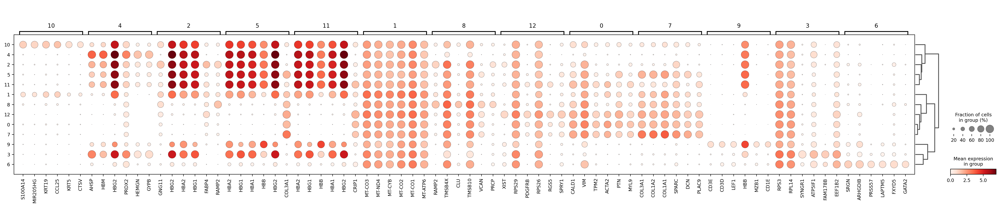

In [148]:
sc.set_figure_params(figsize=[20,10],fontsize=10,dpi=100)

sc.pl.rank_genes_groups_dotplot(subset, n_genes=6)

In [263]:
# update original 
# adata_tmp.obs['annotation_level_4'] = adata_full.obs['annotation_level_4']

adata_tmp.obs['annotation_level_4'] = adata_tmp.obs['annotation_level_4'].astype('object')
adata_tmp.obs['annotation_level_4'][subset.obs.index] = subset.obs['annotation_level_4']
adata_tmp.obs['annotation_level_4'] = adata_tmp.obs['annotation_level_4'].astype('category')

adata_tmp.obs['annotation_level_4']

# adata_tmp = sc.read_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/Thymus_Atlas_Full_postQC_SCVI_v5_'+'_'.join(subgroup)+'.h5ad')


adata_tmp.write_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/Thymus_Atlas_Full_postQC_SCVI_v5_'+'_'.join(subgroup)+'.h5ad')

/tmp/ipykernel_27847/779528481.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_tmp.obs['annotation_level_4'][subset.obs.index] = subset.obs['annotation_level_4']


In [267]:
adata_full.obs['annotation_level_4'] = adata_full.obs['annotation_level_4'].astype('object')
adata_full.obs['annotation_level_4'][adata_tmp.obs.index] = adata_tmp.obs['annotation_level_4']
adata_full.obs['annotation_level_4'] = adata_full.obs['annotation_level_4'].astype('category')


# adata_tmp = sc.read_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/Thymus_Atlas_Full_postQC_SCVI_v5_'+'_'.join(subgroup)+'.h5ad')

In [3]:
adata_full = sc.read_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/annotation_done/Thymus_Atlas_v8.h5ad')

In [12]:
sc.set_figure_params(figsize=[15,15],fontsize=10)
# sc.pl.umap(adata_full, color=['annotation_level_4'],groups='DP(P)-1', legend_loc='on data',s=2)
sc.pl.umap(adata_full, color=['annotation_level_0','annotation_level_1','annotation_level_4'], legend_loc='on data',s=2)

In [11]:
series = adata_full.obs['annotation_level_4']
series = series.astype('object')
group = 'annotation_level_4'
annoatate = ['abT(pre)']
# annoatate = ['']

series[adata_full.obs[group].isin(annoatate)] = 'αβT(entry)'
adata_full.obs['annotation_level_4'] = series.astype('category')

In [9]:
np.unique(adata_full.obs['annotation_level_4'].tolist())

array(['ArtEC', 'B(P)', 'B(Q)', 'B-pro/pre', 'B_stimulated', 'CD4+T',
       'CD4+T(naive)', 'CD4+Tmem', 'CD8+T', 'CD8+T(naive)', 'CD8+Tmem',
       'CD8αα(I)', 'CD8αα(II)', 'CD8αα(entry)', 'CapEC', 'DC1', 'DC2',
       'DN(CD25)', 'DN(CD25-CD99)', 'DN(P)', 'DN(P-early)', 'DN(Q)',
       'DN(Q-CD99)', 'DN(early)', 'DN_(PQ)', 'DN_unknown', 'DP(P)-1',
       'DP(P)-2', 'DP(P)-3', 'DP(P)-4', 'DP(Q)', 'DP_CD99', 'DP_HSPH1',
       'DP_unknown', 'DP_unknown-2', 'ETP', 'FailQC', 'Fb-SBSPON',
       'Fb_1_2', 'Fb_unknown', 'IFI44L_EC', 'InterloFb',
       'InteroFb-COL9A3', 'LympaticEC', 'Macrophage_163', 'Macrophage_68',
       'Macrophage_CD3', 'Mast', 'Mesothelium', 'Monocyte', 'Mural', 'NK',
       'Neutrophil', 'PDGFRAlo-medFb', 'Pericyte', 'Pericyte_CCL19',
       'Pericyte_COL1A1', 'PeriloFb', 'Prolif-mcTEC', 'ProlifCD8+T',
       'ProlifCapEC', 'ProlifPericyte', 'ProlifPeriloFb', 'RBC',
       'RGS5-medFb', 'SMC', 'SP_HSP', 'T(agonist)', 'TEC-tuft',
       'TEC_cilliated', 'TEC_myo', 

In [13]:
adata_full.write_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/annotation_done/Thymus_Atlas_v8.h5ad')